In [13]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import librosa
import soundfile as sf
import scipy
import numpy as np
import math
from collections import defaultdict
from tqdm import tqdm
import matplotlib.animation
import matplotlib.pyplot as plt
from IPython.display import HTML

# TSIA202a - First Practice Session
The goal of this first practical work is to experiment the estimation of second order moments for
random processes, and to simply compare them with their theoretical version. 

Let consider the following real processes:
-  White Noise (denoted $\text{WN}$) $Z_t$ with variance $\sigma^2$ (use `np.random.normal`)
-  $X_t=a+bZ_t+Z_{t-1}$ where $Z_t \sim \text{WN}\left(0,\sigma^2\right)$
- $X_t = \sum_{k=0}^{K}2^{-k}Z_{t-k} + a$ (with $K$ "big enough")
- Harmonic Process: $X_t=A_0\cos(\lambda_0t+\Phi_0)+Z_t$ where $\lambda \in [0,\pi[,$ $\Phi_0 \sim \mathcal{U}([0,2\pi])$ (*e.g.* `np.random.uniform`)

For each of them:
1. Compute the theoretical mean and autocovariance of the previous mentioned real processes using the formulas $\mathbb{E}(X_n)$ and $\mathrm{Cov}(X_{n},X_{n+h})$.
2. Compute their empirical mean and empirical autocovariance function using course's formulas in python.
3. Plot the theoretical operator and empirical estimators for various sampling many times and comment.
4. For a given number $ T \in \{10, 100, 500, 1000\}$ of samples $X_1, \dots, X_T$:
  - for a given draw, compute the mean squared error (MSE) $\frac{1}{T}\sum_t (\gamma_{t} - \hat{\gamma_{t}})^2$ between the theoretical and the empirical autocovariance function denoted $\gamma$ and $\hat{\gamma}$ respectively.
  - Repeat the previous step $100$ times and saves all the results.
  - compute the boxplot of the MSE for each $T$ and comment.




----
----
# **Compte rendu TP1 - Chloé Court / Jean Sainte-Beuve**

----
# Question 1

## 1-

The mean and autocovariance of a white noise follow from its definition. Indeed, the mean of a white noise is :  

$$E(Z_t) = 0$$ 

and its autocovariance is such that :  

$$
\gamma(h) =
\begin{cases}
  \sigma^2 & \text{if } h = 0, \\
  0 & \text{otherwise}.
\end{cases}
$$

## 2- 

$$ E(X_t) = a$$  

$$\gamma(h) = (b^2 + 1)\sigma^2\delta _h + b\sigma^2\delta _{h-1} + b\sigma^2\delta _{h+1}$$ 

## 3-

$$E(X_t) = E(a) = a$$ 

$$\gamma(h) = E((X_t - E(X_t))(X_{t+h}-E(X_{t+h}))) = \begin{cases}
  \sigma^2 2^{2-h}  \frac {4^h-4^{-K-1+h}}{3} & \text{if } 0\leq h\leq K, \\
  \sigma^2 2^{2-h}  \frac {1-4^{-K-1}}{3} & \text{if} -K\leq h\leq 0, \\
  0 & \text{otherwise}.
\end{cases}$$

## 4-

$$E(X_t) = 0$$  

$$\gamma(h) = \frac{A_0^2}{2}cos(\lambda _0 h) + \sigma^2\delta _h$$ 
because $ Z_t $ and $ \phi_ 0 $ are independant.

## Theoretical autocovariances :

In [39]:
#parameters
sigma_squared = 1
n = 1000
a=1
b=10
K=10000
A0=1
λ = np.pi /2

def wn_autocov(h) :
    if (h==0) :
        return (sigma_squared)
    else :
        return (0)
    
def autocov_2(h) :
    if (h == 0):
        return (b**2 + 1)*sigma_squared
    elif (h == 1 or h == -1) :
        return (b*sigma_squared)
    else :
        return 0
    
def autocov_3(h) :
    if(0<=h<=K):
        return (sigma_squared * 2 ** (2-h) * (1 - 4**(-K-1-h))/3)
    elif(-K<=h<=0):
        return (sigma_squared * 2 ** (2-h) * ((1/4)**(-h) - 4**(-K-1))/3)
    else:
        return 0

def autocov_4(h) :
    if (h == 0):
        return (A0**2/2 + sigma_squared)
    else :
        return (A0**2/2 * np.cos(λ*h))

----
# Question 2

In [15]:
def signal1(n) :
    return np.random.normal(loc=0, scale=np.sqrt(sigma_squared), size=n)

def signal2(n) :
    WN=signal1(n)
    X = [a + b*WN[0]]
    for t in range(1,n) : 
        X.append(a + b*WN[t] + WN[t-1])
    return X

def signal3(n) :
    WN=signal1(n)
    X = []
    for t in range(n) :
        S = a
        for k in range(K + 1) :
            if(t>=k) :
                S += 2**(-k) * WN[t-k]
        X.append(S)
    return X

def signal4(n) :
    WN=signal1(n)
    ϕ = np.random.uniform(0, 2*np.pi)
    X = []
    for t in range(n) :
        X.append(A0*np.cos(λ*t + 0) + WN[t])
    return X

def Mean(X, m) :
    S = 0
    for k in range(m+1) :
        S += X[k]
    return(S/m)

def Autocovariance(X, h, m) :
    R = 0
    if (h >= 0 and h <= m-1) :
        for t in range(1, m - h + 1) :
            R += (X[t+h] - Mean(X, m)) * np.conjugate(X[t] - Mean(X,m))
        return (R / m)
    elif (-h <= m-1 and -h >= 0) :
        for t in range(1-h, m+1) :
            R += (X[t+h] - Mean(X,m)) * np.conjugate(X[t] - Mean(X,m))
        return (R / m)
    return R

"""tests with sigma_squared = 0,000001
print(Mean(signal1(n+1), n))
print(Mean(signal2(n+1), n))
print(Mean(signal3(n+1), n))"""

'tests with sigma_squared = 0,000001\nprint(Mean(signal1(n+1), n))\nprint(Mean(signal2(n+1), n))\nprint(Mean(signal3(n+1), n))'

----
# Question 3

##
- Mean

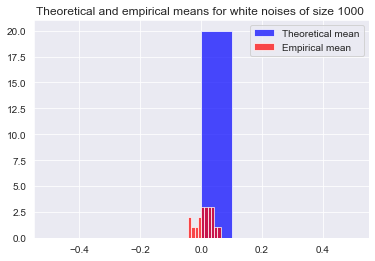

In [16]:
#m is the precision of the mean and p the number of calculation of the mean
def plot_mean(func,p,m) :
    Y = []
    for i in range(p) :
        sig = func(n)
        Y.append(Mean(sig, m))
    plot_theo_mean(p)
    plt.hist(Y, color='red', alpha=0.7, label='Empirical mean')
    plt.legend()
    plt.title(f'Theoretical and empirical means for white noises of size {n} ')

def plot_theo_mean(p):
    X = p * [0]
    plt.hist(X, color='blue', alpha=0.7, label='Theoretical mean')

plot_mean(signal1, 20,n-1)

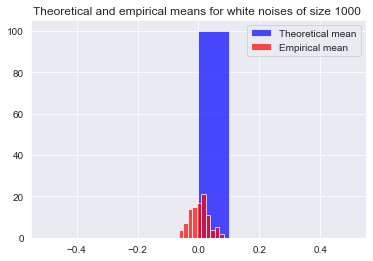

In [17]:
plot_mean(signal1, 100, n-1)

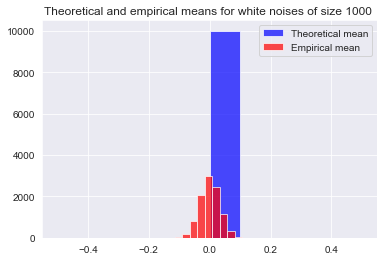

In [18]:
plot_mean(signal1, 10000, n-1)

> It is clear that the empirical mean approaches the theoretical mean as the size of the white noise tends towards large values.

- Autocovariance

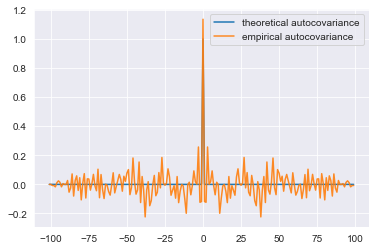

In [19]:
def plot_autocovariance(func, m) :
    Y = []
    H = []
    sig=func(n)
    for h in range (-m-1, m) :
        Y.append(Autocovariance(sig, h, m))
        H.append(h)
    plot_aut_sig(m, H)
    plt.plot(H,Y, alpha = 0.9, label='empirical autocovariance')
    plt.legend()

def plot_aut_sig(m, H) :
    X = []
    for h in range(-m-1, m) :
        X.append(wn_autocov(h))
    plt.plot(H, X, label='theoretical autocovariance')

plot_autocovariance(signal1, 100)


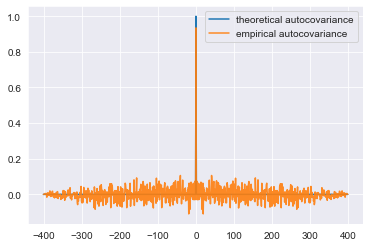

In [20]:
plot_autocovariance(signal1, 400)

>The empirical autocovariance is near 0 for values of h other than 0. For h equal to 0, the empirical autocovariance is near sigma_squared which is coherent.  
>To be more precise in the calculation of the empirical autocovariance, it is possible to higher m (but m can not be higher than n-1).

## 2- 
- Mean

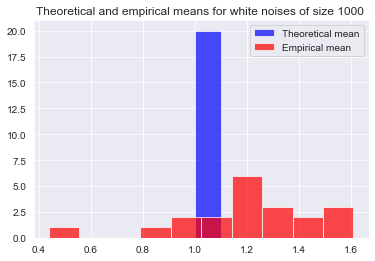

In [21]:
def plot_theo_mean(p) :
    X = p *[a]
    plt.hist(X, color='blue', alpha=0.7, label='Theoretical mean')

plot_mean(signal2, 20, n-1)

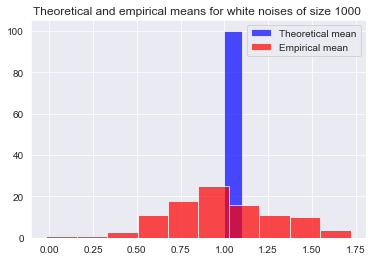

In [22]:
plot_mean(signal2, 100, n-1)

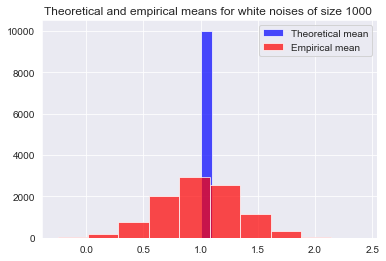

In [23]:
plot_mean(signal2, 10000, n-1)

>As for with the white noise, the empirical mean approaches the theoretical one as the size of the process tends towards large values.

- Autocovariance

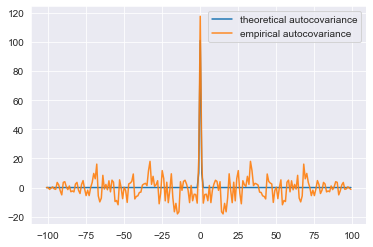

In [24]:
def plot_aut_sig(m, H) :
    X = []
    for h in range(-m-1, m) :
        X.append(autocov_2(h))
    plt.plot(H, X, label='theoretical autocovariance')

plot_autocovariance(signal2, 100)

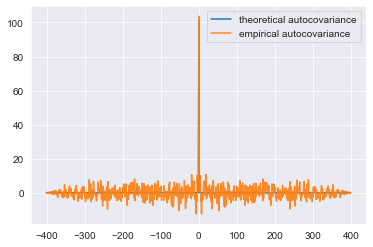

In [25]:
plot_autocovariance(signal2, 400)

## 3-
- Mean

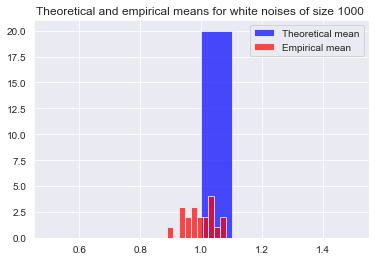

In [26]:
plot_mean(signal3, 20, n-1)

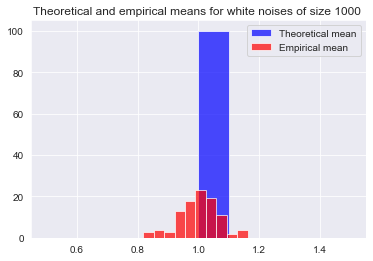

In [27]:
plot_mean(signal3, 100, n-1)

- Autocovariance

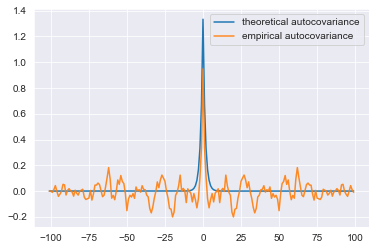

In [42]:
def plot_aut_sig(m,H) :
    X = []
    for h in range(-m-1, m) :
        X.append(autocov_3(h))
    plt.plot(H, X, label='theoretical autocovariance')

plot_autocovariance(signal3, 100)

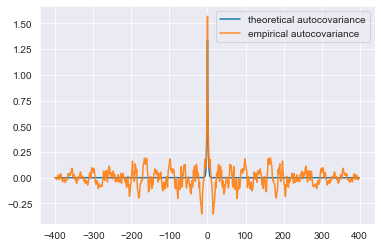

In [43]:
plot_autocovariance(signal3, 400)

>The empirical autocovariance is very similar to the theoretical one.
>In practice, a slight random oscillation around 0 for h different then 0 is observed, which is consistent with the theory.

# 4-
- Mean

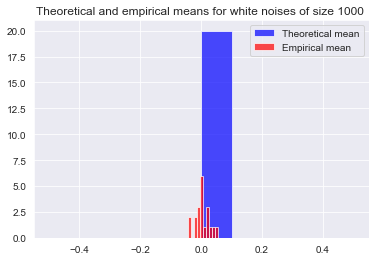

In [ ]:
def plot_theo_mean(p):
    X = p * [0]
    plt.hist(X, color='blue', alpha=0.7, label='Theoretical mean')
    
plot_mean(signal4, 20, n-1)

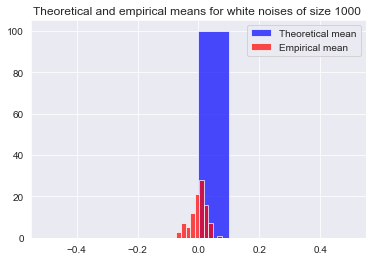

In [ ]:
plot_mean(signal4, 100, n-1)

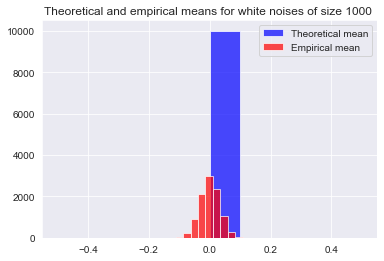

In [ ]:
plot_mean(signal4, 10000, n-1)

- Autocovariance

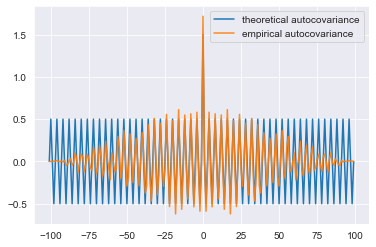

In [ ]:
def plot_aut_sig(m, H) :
    X = []
    for h in range(-m-1, m) :
        X.append(autocov_4(h))
    plt.plot(H, X, label='theoretical autocovariance')

plot_autocovariance(signal4, 100)

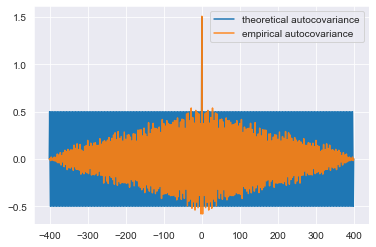

In [ ]:
plot_autocovariance(signal4, 400)

The empirical autocovariance is very similar to the theoretical one around zero and the more |h| gets high and the more the empirical autocovariance is attenuated (finite signal).

> In practice, the mean is close to the theoretical one for all four processes, which is consistent with the theory.  
> For the autocovariances, there is a great similarity between the theoretical and empirical curves for the three processes.  

----
# Question 4

In [44]:
def mean_squared_error(X, autocov, T) :
    sig = X(n)
    S = 0
    for t in range (T + 1) :
        S += (autocov(t) - Autocovariance(sig, t, 100))**2
    return (S/T)

- 1/ White noise

In [ ]:
mean_squared_error(signal1, wn_autocov, 10)

0.0036349743260452373

In [ ]:
mean_squared_error(signal1, wn_autocov, 100)

0.0027464405263393325

In [ ]:
mean_squared_error(signal1, wn_autocov, 500)

0.0013642688309949318

In [ ]:
mean_squared_error(signal1, wn_autocov, 1000)

0.0004165897902788244

- 2/

In [ ]:
mean_squared_error(signal2, autocov_2, 10)

111.23459642961794

In [ ]:
mean_squared_error(signal2, autocov_2, 100)

80.20805286304964

In [ ]:
mean_squared_error(signal2, autocov_2, 500)

6.497661899483104

In [ ]:
mean_squared_error(signal2, autocov_2, 1000)

3.7758407644147676

- 3/

In [45]:
mean_squared_error(signal3, autocov_3, 10)

0.0635621362391752

In [46]:
mean_squared_error(signal3, autocov_3, 100)

0.021618811941264623

In [47]:
mean_squared_error(signal3, autocov_3, 500)

0.0018847440632883067

In [48]:
mean_squared_error(signal3, autocov_3, 1000)

0.0008401913526402332

- 4/

In [ ]:
mean_squared_error(signal4, autocov_4, 10)

0.014047170486213933

In [ ]:
mean_squared_error(signal4, autocov_4, 100)

0.03875175865423499

In [ ]:
mean_squared_error(signal4, autocov_4, 500)

0.10901513771609135

In [ ]:
mean_squared_error(signal4, autocov_4, 1000)

0.11936942783617678

## 2- Repeat the previous step 100 times

In [50]:
def plot_MSE(X, autocov, T) :
    Y = []
    for i in range(100):
        Y.append(mean_squared_error(X, autocov, T))
    plt.hist(Y, color='red', alpha=0.7, label='Mean squared error')
    plt.legend()
    plt.title(f'Mean squared error for signal = {X} with T = {T} ')

- 1- White noise

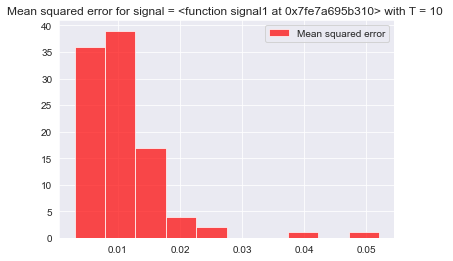

In [ ]:
plot_MSE(signal1, wn_autocov, 10)

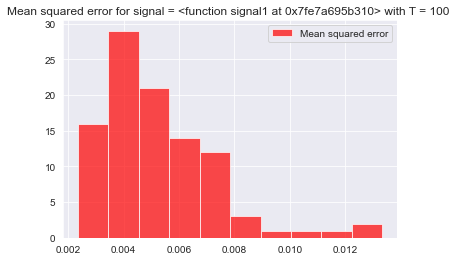

In [ ]:
plot_MSE(signal1, wn_autocov, 100)

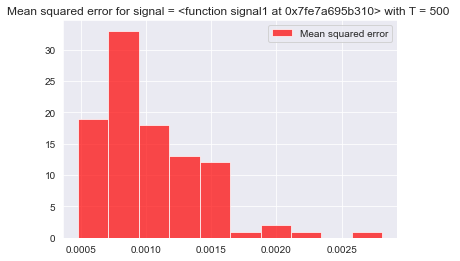

In [ ]:
plot_MSE(signal1, wn_autocov, 500)

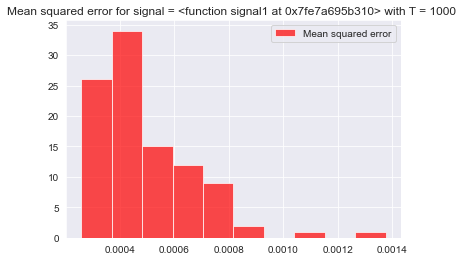

In [ ]:
plot_MSE(signal1, wn_autocov, 1000)

The mean squared error tends to zero when T tends to the infinite. Though even for a small number of samples the empirical autocovariance is precise.

- 2-

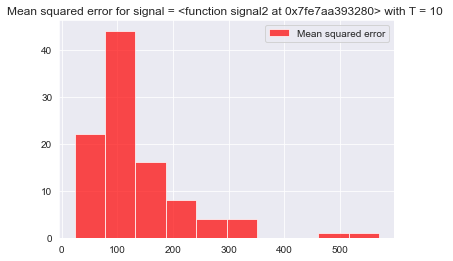

In [ ]:
plot_MSE(signal2, autocov_2, 10)

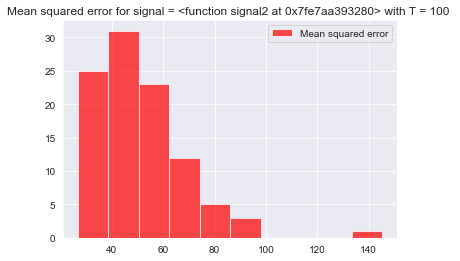

In [ ]:
plot_MSE(signal2, autocov_2, 100)

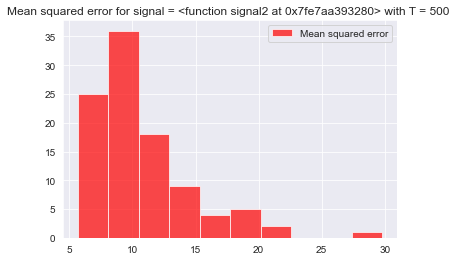

In [ ]:
plot_MSE(signal2, autocov_2, 500)

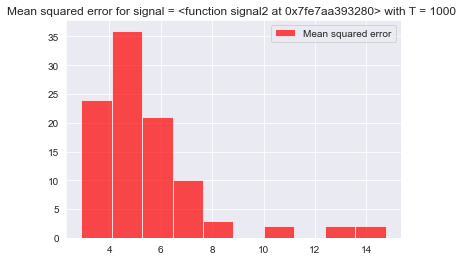

In [ ]:
plot_MSE(signal2, autocov_2, 1000)

The mean squared error is quite high when T is low. To have a precise autocovariance, it is necessary to have a very high (more than a thousand) number of samples.

- 3-

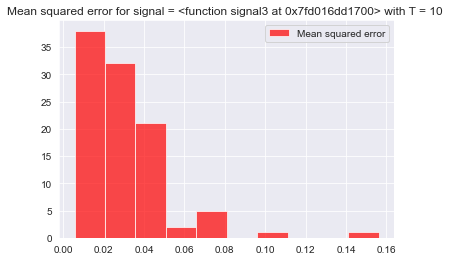

In [51]:
plot_MSE(signal3, autocov_3, 10)

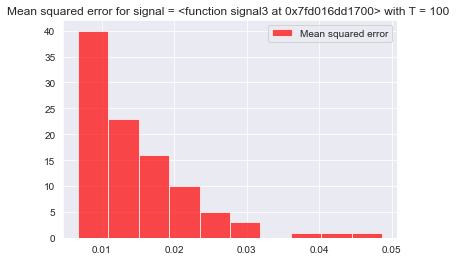

In [52]:
plot_MSE(signal3, autocov_3, 100)

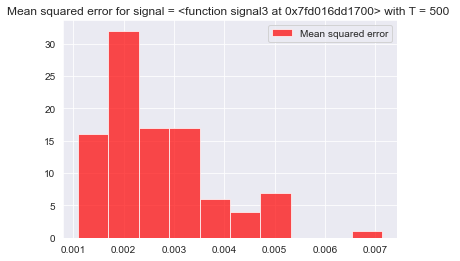

In [53]:
plot_MSE(signal3, autocov_3, 500)

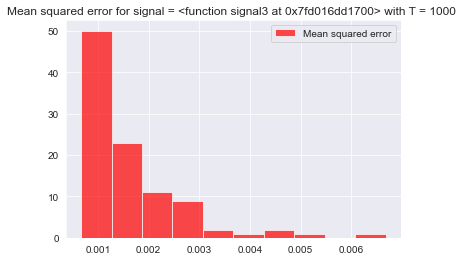

In [54]:
plot_MSE(signal3, autocov_3, 1000)

The empirical autocovariance of the third function is also precise when T is low. We can see that with a T equal to 10,100,500 or 1000, the precision is better but not much. For this function, the number of samples is not important to get more precision in the empirical autocovariance.

- 4-

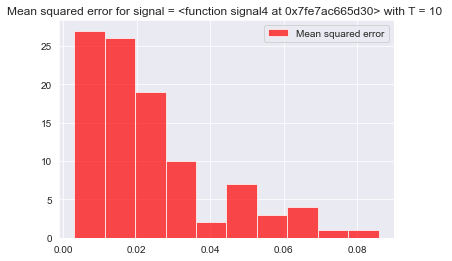

In [ ]:
plot_MSE(signal4, autocov_4, 10)

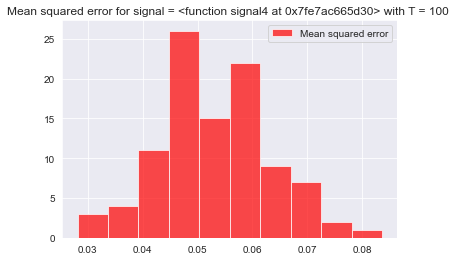

In [ ]:
plot_MSE(signal4, autocov_4, 100)

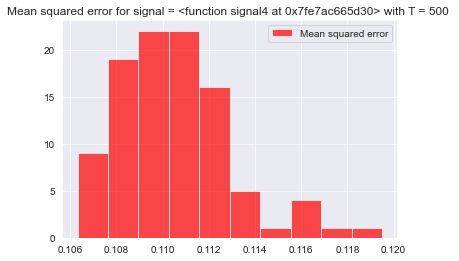

In [ ]:
plot_MSE(signal4, autocov_4, 500)

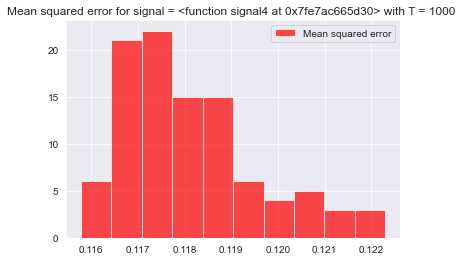

In [ ]:
plot_MSE(signal4, autocov_4, 1000)

For this function, the mean squared error is lower for a low T. It is then better to have a small number of samples to be more precise in the autocovariance. The empirical autocovariance is very precise for T=10.

# TSIA202a - Second Practice Session : Spectral density estimation and periodogram
The goal of this second session is to provide a power spectral density estimator of a real, zero-mean, weakly stationary process $X_t$. We suppose that we have access to $n$ observations and we will use the FFT algorithm (that implements the DFT) using `numpy.fft.fft`.
Recall (from the course) that the periodogram of the observations $X_0, \dots, X_{n-1}$ can be given as:
$$
I_n(\lambda) = \frac{1}{2\pi n}|\sum_{k=0}^{n-1} X_k e^{i\lambda k}|^2
$$

Moreover, the Hertglotz theorem provides a relation between the empirical autocovariance $\hat{\gamma}_n$ and the periodogram $I_n$:
$$
\hat{\gamma}_n(k) = \int_{0}^{2\pi}e^{i\lambda k}I_n({\lambda})d\lambda
$$

1. For a given $m \geq n$  we denote also the DFT as:
$$
DFT(X,m)(k) = \sum_{h=0}^{n-1}X_he^{-2i\pi\frac{kh}{m}}
$$
Show the following relation: 
$$I_n(\frac{2\pi k}{m}) = \frac{1}{2\pi n} |DFT(X,m)(k)|^2$$
2. provide a script that compute those $I_n(\frac{2\pi k}{m})$ for the time series mentioned in the first practice session
3. Show that $I_n(\lambda) = \frac{1}{2\pi} \sum_{k=0}^{n-1} \hat{\gamma}_n(k)e^{-i\lambda k}$
4. How to choose $m$ in order to get a simple relation between $\hat{\gamma}_n(k)$ and $I_n(\frac{2\pi k}{m})$ ? At the end, given a specific $\tilde{m}$ show that:
$$
\hat{\gamma}_n(k) = \frac{1}{n} IDFT\left(\left|DFT(X, \tilde{m})\right|^2, \tilde{m}\right)(k)
$$ Try this estimator on the autocovariance of previous time series of the first session.

5. In the case of white noise, estimate the variance of the periodogram for several values of $n$ and discuss about it.




----
----

# **Compte rendu TP2 - Chloé Court / Jean Sainte-Beuve**

----
# Question 1

with $m \geq n $ and $X_h$ a real process  
$$I_n\left(\frac{2\pi k}{m}\right) = \frac{1}{2\pi n} \left| \sum_{h=0}^{n-1} X_h \exp\left(\frac{2i\pi kh}{m}\right) \right|^2 = \frac{1}{2\pi n} \left| \overline{\sum_{h=0}^{n-1} X_h \exp\left(\frac{2i\pi kh}{m}\right)} \right|^2 = \frac{1}{2\pi n} \left| \sum_{h=0}^{n-1} \underbrace{\overline{X_h}}_{=X_h} \exp\left(\frac{-2i\pi kh}{m}\right) \right|^2 = \boxed{\frac{1}{2\pi n} |DFT(X,m)(k)|^2}
$$


----
# Question 2

In [ ]:
#parameters
n = 1000
sigma_squared = 1
a = 1
b= 10
K=1000
A0=1
λ=np.pi/2
ϕ = np.random.uniform(0, 2*np.pi)

#signals
def signal1(n) :
    return np.random.normal(loc=0, scale=np.sqrt(sigma_squared), size=n)

def signal2(n) :
    WN=signal1(n)
    X = [a + b*WN[0]]
    for t in range(1,n) : 
        X.append(a + b*WN[t] + WN[t-1])
    return X

def signal3(n) :
    WN=signal1(n)
    X = []
    for t in range(n) :
        S = a
        for k in range(K + 1) :
            if(t>=k) :
                S += 2**(-k) * WN[t-k]
        X.append(S)
    return X

def signal4(n) :
    WN=signal1(n)
    ϕ = np.random.uniform(0, 2*np.pi)
    X = []
    for t in range(n) :
        X.append(A0*np.cos(λ*t + 0) + WN[t])
    return X

def I(sig, m):
    X=[2*np.pi/150*k for k in range(0, n-1)]
    n= len(sig)
    return (X, (1/(2*np.pi*n)*np.abs(np.fft.fft(X, m))**2))

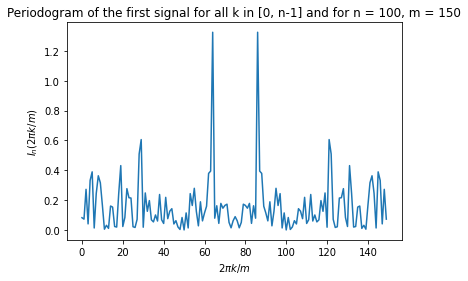

In [ ]:
fig, ax = plt.subplots()
plt.title('Periodogram of the first signal for all k in [0, n-1] and for n = 100, m = 150')
plt.xlabel(r'$2\pi k/m$')
plt.ylabel(r'$I_n(2\pi k/m)$')
plt.plot(I(signal1(100), 150))


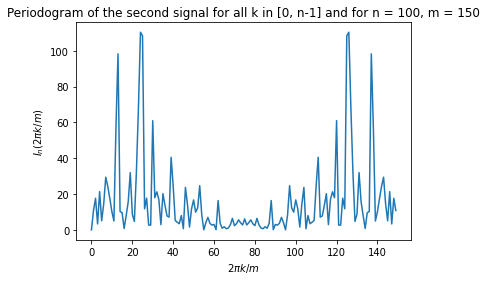

In [ ]:
fig, ax = plt.subplots()
plt.title('Periodogram of the second signal for all k in [0, n-1] and for n = 100, m = 150')
plt.xlabel(r'$2\pi k/m$')
plt.ylabel(r'$I_n(2\pi k/m)$')
plt.plot(I(signal2(100), 150))

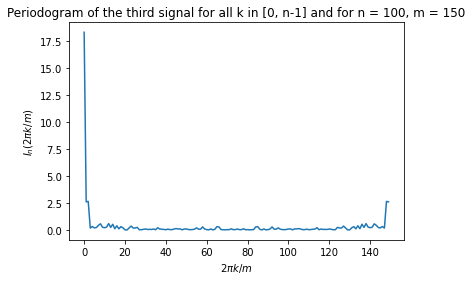

In [ ]:
fig, ax = plt.subplots()
plt.title('Periodogram of the third signal for all k in [0, n-1] and for n = 100, m = 150')
plt.xlabel(r'$2\pi k/m$')
plt.ylabel(r'$I_n(2\pi k/m)$')
plt.plot(I(signal3(100), 150))

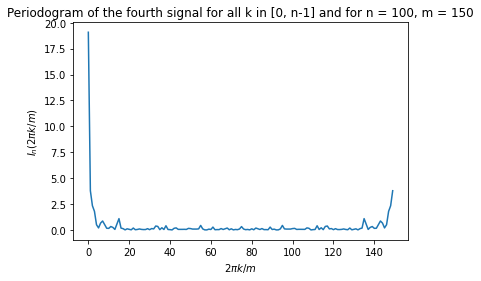

In [ ]:
fig, ax = plt.subplots()
plt.title('Periodogram of the fourth signal for all k in [0, n-1] and for n = 100, m = 150')
plt.xlabel(r'$2\pi k/m$')
plt.ylabel(r'$I_n(2\pi k/m)$')
plt.plot(I(signal3(100), 150))

----
# Question 3

$$ \begin{align} \frac{1}{2\pi}\sum_{k=0}^{n-1} \hat{\gamma _n}(k)e^{-i\lambda k}

&= \frac{1}{2\pi}\sum_{k=0}^{n-1}(\int_{0}^{2\pi} e^{i\mu k}I_n(\mu)\, d\mu )e^{-i\lambda k}\nonumber\\ 

&= \frac{1}{2\pi}\sum_{k=0}^{n-1}(\int_{0}^{2\pi} e^{i\mu k}\frac{1}{2\pi n} \left| \sum_{j=0}^{n-1} X_j e^{i\mu j} \right|^2 \, d\mu )e^{-i\lambda k}\nonumber\\ 

&= \frac{1}{2\pi}\sum_{k=0}^{n-1}(\int_{0}^{2\pi} e^{i\mu k}\frac{1}{2\pi n}\sum_{j=0}^{n-1}\sum_{p=0}^{n-1}X_j\overline{X_p}e^{i \mu j} e^{-i \mu p}   \, d\mu )e^{-i\lambda k}\nonumber\\ 

&= \frac{1}{4\pi^2 n }\sum_{k=0}^{n-1}\sum_{j=0}^{n-1}\sum_{p=0}^{n-1}X_j\overline{X_p}e^{-ik\lambda}\int_{0}^{2\pi}e^{i\mu (k+j-p)}\, d\mu\nonumber\end{align}
$$

Though, 
$\boxed{\int_{0}^{2\pi}e^{i\mu (k+j-p)}\, d\mu = \begin{cases}
  2\pi & \text{if }  (k+j-p) = 0, \\
  0 & \text{otherwise}.
\end{cases}}$

So,  

$$\begin{align}\frac{1}{2\pi}\sum_{k=0}^{n-1} \hat{\gamma _n}(k)e^{-i\lambda k}
&= \frac{1}{2\pi n} \sum_{k=0}^{n-1}\sum_{j=-k}^{n-1-k} X_j \overline{X_{k+j}} e^{-ik\lambda}\nonumber\\

&= \frac{1}{2\pi n} \sum_{k=0}^{n-1}\sum_{j=0}^{n-1} X_j \overline{X_k} e^{-i(k-j)\lambda}\nonumber\\

&= \frac{1}{2\pi n} \sum_{j=0}^{n-1}X_j e^{ij\lambda}\sum_{k=0}^{n-1} \overline{X_k} e^{-ik\lambda}\nonumber\\

&= \boxed{\frac{1}{2\pi n} \left| \sum_{j=0}^{n-1} X_j e^{i\lambda j} \right|^2 = I_n(\lambda)}\nonumber\end{align}$$


----
# Question 4

Let $m \geq n$. We choose that relationship because as sigma is of length $n$, no additional information would be considered by taking $m>n$.

$\quad I_n(\frac {2\pi k} m) = \frac{1}{2\pi}\sum_{j=0}^{n-1} \hat{\gamma _n}(j)e^{-i\frac {2\pi k} m j}$

Then,  

$\quad I_n(\frac {2\pi k} m) = \frac{1}{2\pi}\sum_{j=0}^{n-1} \hat{\gamma _n}(j)e^{-i\frac {2\pi k} m j} = \frac{1}{2\pi n} |DFT(X,m)(k)|^2\quad$ (see Question 1)

So,

$\quad \sum_{j=0}^{n-1} \hat{\gamma _n}(j)e^{-i\frac {2\pi k} m j} = \frac{1}{n} |DFT(X,m)(k)|^2$

which prooves :

$\hat{\gamma}_n(k) = \frac{1}{n} IDFT\left(\left|DFT(X, m)\right|^2, m\right)(k)\quad$ by definition of the IDFT.

----

# Question 5

To estimate the variance of the periodogram, we will use the formula bellow :

$Var(X) = \hat{\gamma}_n(0) = \frac{1}{n} IDFT\left(\left|DFT(X, m)\right|^2, m\right)(0)\quad$

/opt/anaconda3/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


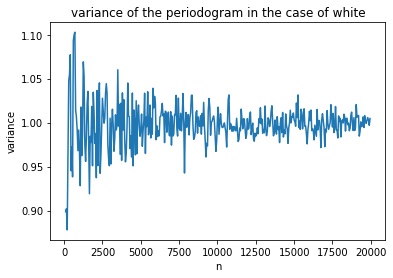

In [ ]:
var = []
#here m=n
for n in np.arange(100, 20000, 50):
    X=signal1(n)
    var.append(1/n*np.fft.ifft(np.abs(np.fft.fft(X, n))**2, n)[0])

plt.title('variance of the periodogram in the case of white')
plt.xlabel('n')
plt.ylabel('variance')
plt.plot(np.arange(100, 20000, 50), var)


> As the number n increases, the more the variance tends to $\sigma^2$, which is consistent with the theory. With small n the variance is also quite near the theoretical one (around 10% of mistake).

# TSIA202a - Chloé Court - Jean Sainte-Beuve - Third Practice Session

The goal of this third partical work is to use an AR(p) process to model a speech signal, and show that this approch is surprisingly powerful despite its simplicity.

The proposed synthesis algorithm divides into several steps.
1. Filter the audio signal to emphasize the highest frequencies (in order to flatten the spectrum and reduce precision issues with FFT computations).
2. Split the signal into several overlapping frames and iterate over them.
    1. Detect if the frame corresponds to noise or to a voiced signal, and estimate the fundamental frequency in the later case.
    2. Estimate the AR(p) coefficients using Yule-Walker equations.
    3. Re-synthetise the frame using the AR(p) coefficients, starting from a white noise in the case of a noisy frame, or a Dirac comb in the case of a voiced frame.
3. Overlap-add the synthesized frames with a Hanning window.
4. Filter the synthesised signal to de-emphasize the highest frequencies.

We propose to implement this algorithm in two parts. First, we will derive the Yule-Walker equations, and test them on synthetic data. Then, we will code the synthesis algorithm and apply it on a real world speech signal.

----
----
# 1. Yule-Walker equations

Let us consider a causal, zero-mean, AR(p) process defined by the following recurrent equation: 
$$
X_t = \phi_1 X_{t-1} + \phi_2 X_{t-2} + \ldots + \phi_p X_{t-p} + Z_{t}
$$
where $\{Z_t , t \in \mathbb{Z}\}$ is a weak white noise with variance $\sigma^2$.

1. Show that, $\forall h \geq 1, \mathbb{E}[X_{t-h}Z_t]=0$.
2. Deduce a recurrent relation between $\gamma(h)$ and $\gamma(h-1),\gamma(h-2),\ldots,\gamma(h-p)$, for $h \geq 1$.
3. We consider separately the case $h=0$: find a new relationship between $\gamma(0)$ and $\gamma(-1),\gamma(-2),\ldots,\gamma(-p)$.
4. Put these relationships in matrix form:
$\begin{equation}
\Gamma_{p+1}[1 \; -\phi_1 \; \ldots \; -\phi_p]^T = [\sigma^2 \; 0 \; \ldots \; 0]^T 
\end{equation}$
where $\Gamma_{p+1}$ is a suitable Toeplitz matrix that you have to determine.

----
## Question 1 -

$\forall h \geq 1$, 
$\begin{align}
E(X_{t-h}Z_t) &= \boxed{E(X_{t-h})E(Z_t)=0}\nonumber\\
\end{align}
$
because $X_{t-h} \perp Z_t$,

$\quad$ Indeed, $X_{t-h}$ only depends on instants before $t-h$ and since $h\geq 1$, $t-h < t $. So, $X_{t-h}$ do not depend on $Z_t$.

----
## Question 2 -

$\forall h \geq 1$, 
$\begin{align}
\gamma (h) &= Cov(X_t, X_{t+h})\nonumber\\
&= E(X_tX_{t+h})\nonumber\\
&= E(X_t(\sum_{i=1}^p \phi _iX_{t+h-i} + Z_{t+h}))\nonumber\\
&= \sum_{i=1}^p \phi _iE(X_tX_{t+h-i}) + \underbrace{E(X_tZ_{t+h})}_{E(X_t)E(Z_{t+h}=0)}\quad(\text{ because } Z_t \perp Z_{t+h})\nonumber\\
&= \boxed{\sum_{i=1}^p \phi _i\gamma(h-i) = \gamma (h)}\nonumber\\
\end{align}
$

---- 
## Question 3 -
$\begin{align}
\gamma (0) &= Cov(X_0^2)\nonumber\\
&= E(X_0^2)\nonumber\\
&= E((\sum_{i=1}^p \phi _iX_{-i} + Z_{0})X_0)\nonumber\\
&= \sum_{i=1}^p \phi _i\underbrace{E(X_{-i}X_0)}_{\gamma(-i)} + \underbrace{E(Z_{0}X_0)}_{\sigma^2}\nonumber\\
&= \boxed{\sum_{i=1}^p \phi _i\gamma(-i) + \sigma^2 =\gamma (0)} \nonumber\\
\end{align}
$

----
## Question 4 -

$\begin{equation}
\begin{bmatrix}
  \gamma(0) & \gamma(-1) & \ldots & \gamma(-p) \\
  \gamma(1) & \gamma(0) & \ldots & \gamma(1-p)\\
  \vdots & \vdots & \ddots & \vdots\\
  \gamma(p) & \gamma(p-1) & \ldots& \gamma(0)
\end{bmatrix}                  [1 \; -\phi_1 \; \ldots \; -\phi_p]^T = [\sigma^2 \; 0 \; \ldots \; 0]^T 
\end{equation}$

----
----
# 2. Evaluation on synthetic data

We will now evaluate equation $(1)$ on a synthetically generated AR(p) process.

1. Generate n=1000 samples of an AR(4) process.
2. Estimate $\Gamma_{p+1}$ using these samples.
3. Use equation $(1)$ to estimate $\sigma^2$ and the coefficients $\phi_1,\phi_2,\ldots,\phi_p$. Compute the relative error between the estimated and the true coefficients.
4. Estimate power spectral distribution of the synthesized signal. Compare with the theoretical distribution obtained from the poles of $1/\Phi(z^{-1})$.


----
## Question 1 - Generate n=1000 samples of an AR(4) process.


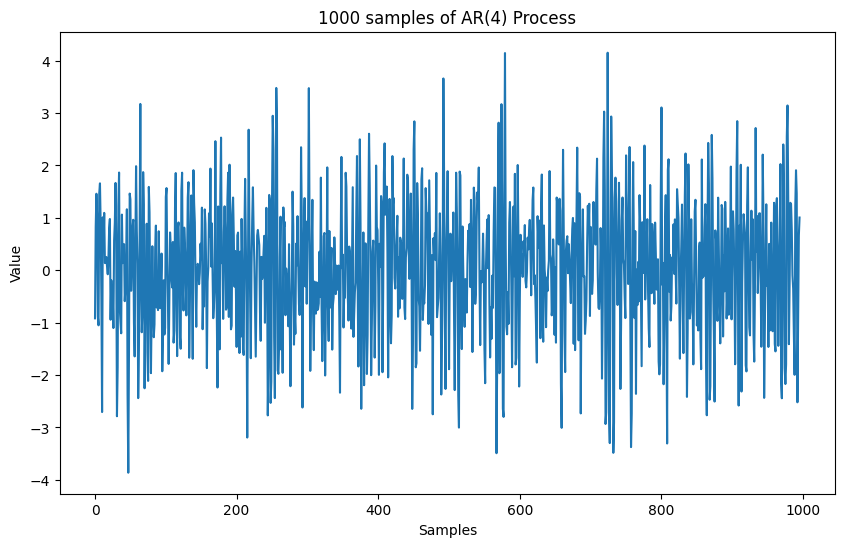

In [ ]:
phi = np.array([0.2, -0.4, -0.3, 0.1])
n = 1000
sigma = 1
p=4

def generate_ar4_process(n, phi_values, sigma):

    p = len(phi_values)
    epsilon = np.random.normal(0, sigma, n)
    ar_process = [0] * p

    for i in range(p, n):
        ar_process.append(sum(phi_values[j] * ar_process[i - j - 1] for j in range(p)) + epsilon[i])

    ar_process = [sum(phi_values[j] * ar_process[i - j - 1] for j in range(p)) + epsilon[i] for i in range(p, n)]

    return ar_process

ar_process = generate_ar4_process(n, phi, sigma)
plt.figure(figsize=(10, 6))
plt.plot(ar_process)
plt.title('1000 samples of AR(4) Process')
plt.xlabel('Samples')
plt.ylabel('Value')
plt.show()

----
## Question 2 - Estimate $\Gamma_{p+1}$ using these samples.

In [ ]:
def autocovariance(signal, h):
    n = len(signal)
    mean = np.mean(signal)
    autocovar = np.sum((signal[:n - h] - mean) * (signal[h:] - mean)) / n
    return autocovar

gamma_5 = np.zeros((5, 5))

for row in range(5):
    for col in range(5):
        gamma_5[row][col] = autocovariance(ar_process, abs(row - col))

# Display gamma as a matrix
for row in gamma_5:
    print(row)

[ 1.64490471  0.34252942 -0.74566614 -0.70211774  0.19632803]
[ 0.34252942  1.64490471  0.34252942 -0.74566614 -0.70211774]
[-0.74566614  0.34252942  1.64490471  0.34252942 -0.74566614]
[-0.70211774 -0.74566614  0.34252942  1.64490471  0.34252942]
[ 0.19632803 -0.70211774 -0.74566614  0.34252942  1.64490471]


----
## Question 3 - Use equation $(1)$ to estimate $\sigma^2$ and the coefficients $\phi_1,\phi_2,\ldots,\phi_p$. Compute the relative error between the estimated and the true coefficients.




In [ ]:
target = np.zeros(5)
target[0] = 1

phi_sigma = np.linalg.solve(gamma_5, target)

estimated_phi = -phi_sigma[1:]
estimated_sigma_squared = phi_sigma[0]

print("phi :", phi)

print("Estimation de phi :", estimated_phi)
erreur_phi = sum(abs(x - y) for x, y in zip(phi, estimated_phi)) / sum(abs(y) for y in estimated_phi)
print("Erreur relative pour l'estimation de phi:", erreur_phi)

print("Estimation de sigma carré :", estimated_sigma_squared)
erreur_sigma = abs(sigma**2 - estimated_sigma_squared) / abs(estimated_sigma_squared)
print("Erreur relative pour l'estimation de sigma carré:", erreur_phi)

phi : [ 0.2 -0.4 -0.3  0.1]
Estimation de phi : [ 0.19234807 -0.37850236 -0.24812699  0.07370103]
Erreur relative pour l'estimation de phi: 0.12022419002153939
Estimation de sigma carré : 0.9342822079417695
Erreur relative pour l'estimation de sigma carré: 0.12022419002153939


----
## Question 4 - Estimate power spectral distribution of the synthesized signal. Compare with the theoretical distribution obtained from the poles of $1/\Phi(z)$.


<Figure size 640x480 with 0 Axes>

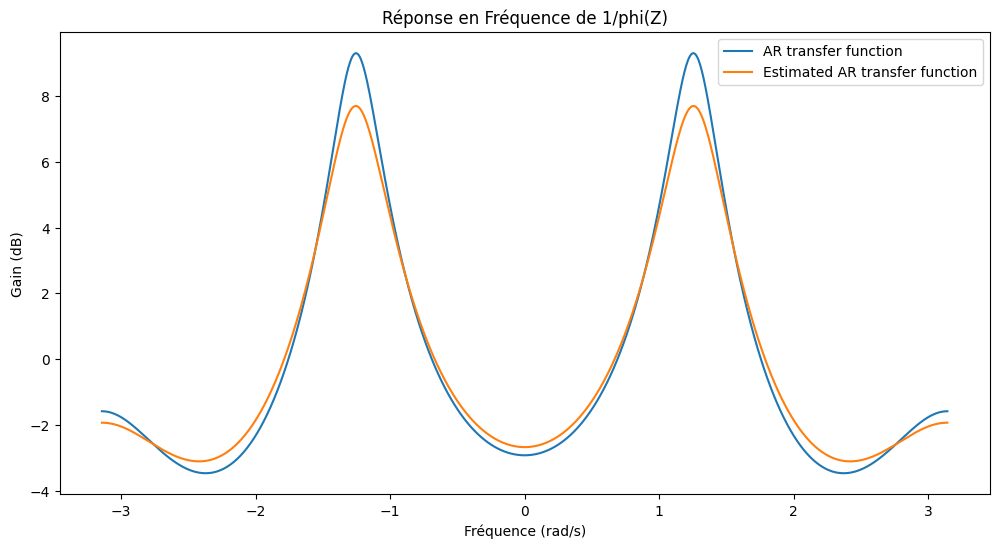

Text(0.5, 1.0, 'Poles of the AR transfer function')

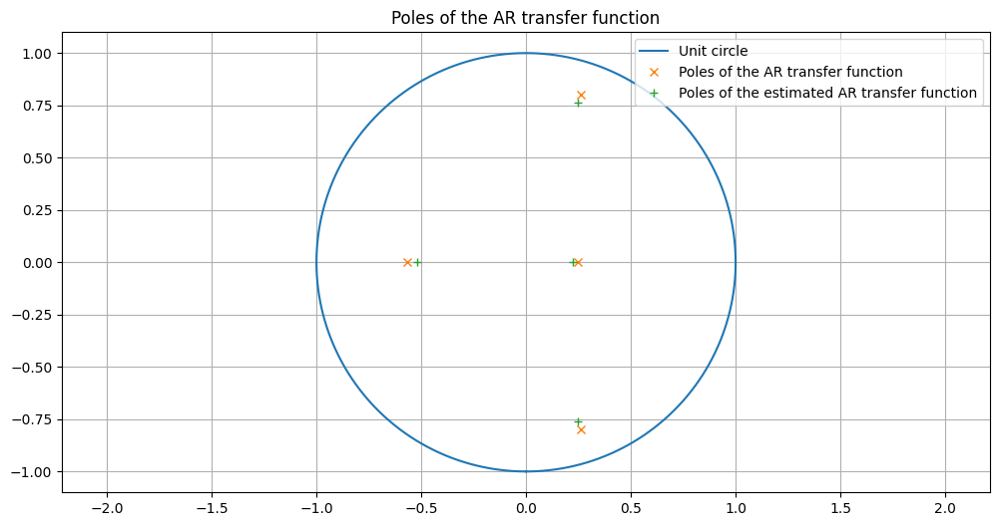

In [ ]:
plt.figure()

coeff = np.concatenate(([1], -phi[:]))
coeff_estimated = np.concatenate(([1],-estimated_phi[:]))

nPoints = int(np.exp2(np.ceil(np.log2(n))))
omega = np.linspace(-np.pi, np.pi, nPoints)

_, response = scipy.signal.freqz(1,coeff, worN=omega)
_, response_est = scipy.signal.freqz(1,coeff_estimated, worN=omega)

z = np.roots(coeff)
z_est = np.roots(coeff_estimated)

plt.figure(figsize=(12, 6))
plt.plot(omega, 20 * np.log10(np.abs(response)))
plt.plot(omega, 20 * np.log10(np.abs(response_est)))
plt.title('Réponse en Fréquence de 1/phi(Z)')
plt.xlabel('Fréquence (rad/s)')
plt.ylabel('Gain (dB)')
plt.legend(['AR transfer function','Estimated AR transfer function' ])
plt.show()

plt.figure(figsize=(12, 6))
t = np.linspace(-np.pi,np.pi,1024)
plt.plot(np.sin(t),np.cos(t))
plt.axis('equal')
plt.grid()
plt.plot(np.real(z),np.imag(z), 'x')
plt.plot(np.real(z_est),np.imag(z_est), '+' )
plt.legend(['Unit circle','Poles of the AR transfer function','Poles of the estimated AR transfer function' ], loc='upper right')
plt.title('Poles of the AR transfer function')

----
----
# 3. Speech modeling

We will now implement the synthesis algorithm and evaluate it on a speech signal. 

A code template is provided below. We will use the file audio.wav to test the algorithm. 


LIsten to the original and synthesized signal by using any audio player. Try to modify the pitch of the synthesised signal and listen to the result.

In [ ]:
## hyperparameters

sampling_rate = 8000 # (Hz)
frame_duration = 0.04 # duration of the analysis frames (seconds)
overlap_ratio = 0.5 # overlap ratio between two consecutive analysis frames
p = 12 # AR(p) model order
f_min = 80 # minimum frequency for pitch detection (Hz)
f_max = 400 # maximum frequency for pitch detection Hz)
pitch_detection_threshold = 0.5 # threshold for pitch detection

In [ ]:
## synthesis

# load audio
x = librosa.load('audio.wav', sr=sampling_rate)[0]

# pre-emphasis filtering
x = scipy.signal.lfilter([1, -0.98], [1], x)

# handy variables
n_frame = math.floor(len(x) / (sampling_rate * frame_duration * (1 - overlap_ratio))) - 1 # discard last frame
frame_length = int(sampling_rate * frame_duration)
min_period = math.floor(sampling_rate / f_max)
max_period = math.ceil(sampling_rate / f_min)
synthesis = np.zeros(len(x))
log_dict = defaultdict(list)

# loop over frames
for frame_index in tqdm(range(n_frame)):

    # extract frame
    start = int(frame_index * sampling_rate * frame_duration * (1 - overlap_ratio))
    end = start + frame_length
    frame = x[start:end]

    # detect pitch
    auto_covariance = np.fft.irfft(np.abs(np.fft.rfft(frame - np.mean(frame), (2*frame_length-1)))**2 / frame_length)[:frame_length]
    pitch, max_value = auto_covariance[min_period:].argmax() + min_period, auto_covariance[min_period:].max() / auto_covariance[0]
    if (pitch > max_period) or (max_value * frame_length / (frame_length - pitch) < pitch_detection_threshold): # detect silent frame 
        pitch = 0
    
    # estimate AR(p) coefficients
    gamma = gamma_5
    v = np.array([1 if k==0 else 0 for k in range(p+1)])
    coefficient = np.concatenate(([1],-estimated_phi[:]))
    sigma = gamma_5[0][0] #variance
   

    # re-synthetise frame
    if pitch == 0:
        noise = np.random.normal(0, np.sqrt(sigma), frame_length)
        frame_r = scipy.signal.lfilter([1], coefficient, noise)
    else:
        dirac_comb = np.zeros(frame_length)
        dirac_comb[::pitch] = 1.0  # create a periodic impulse train with pitch period
        frame_r = scipy.signal.lfilter([1], coefficient, dirac_comb)
    frame_r = np.hstack((frame_r[p:],(np.zeros(p))))
    normalization_factor = np.sqrt(sigma / np.var(frame_r))
    frame_r = normalization_factor * frame_r[:frame_length]

    """print(len(frame_r))
    print(frame_length)"""
    # overlap-add
    synthesis[start:end] += frame_r * np.hanning(frame_length)

    # compute power spectral density (for logging purposes)
    _, original_psd = scipy.signal.freqz(1,np.concatenate(([1],-phi[:])), worN=omega)
    _, synthesis_psd = scipy.signal.freqz(1,coefficient, worN=omega)
  
    # log
    log_dict["frame"].append(frame)
    log_dict["pitch"].append(pitch)
    log_dict["sigma"].append(sigma)
    log_dict["coefficient"].append(coefficient)
    log_dict["frame_r"].append(frame_r)
    log_dict["original_psd"].append(original_psd)
    log_dict["synthesis_psd"].append(synthesis_psd)

# de-emphasis filtering
synthesis = scipy.signal.lfilter([1], [1, -0.98], synthesis)

# log
sf.write('synthesis.wav', synthesis, sampling_rate)
log_dict["synthesis"].append(synthesis)
log_dict = {k: np.array(v) for k, v in log_dict.items()}

100%|██████████| 279/279 [00:00<00:00, 1677.48it/s]


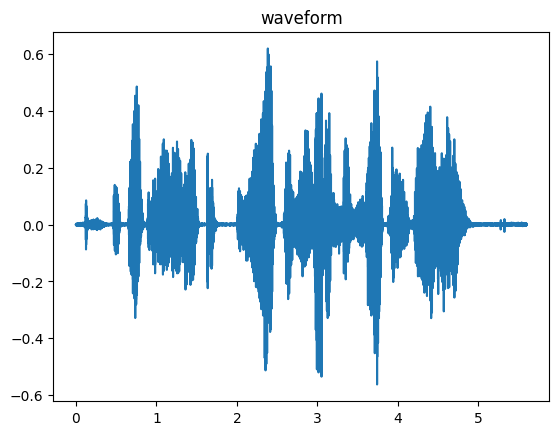

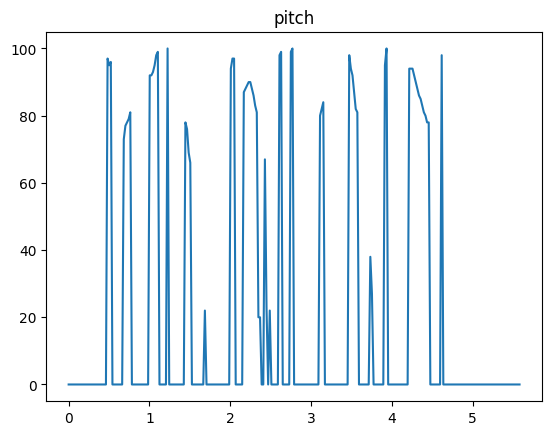

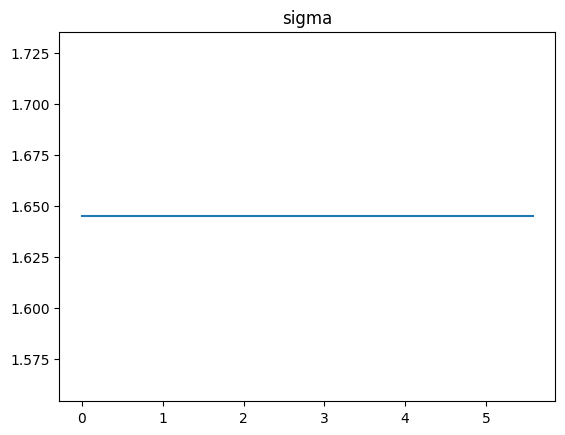

c:\Users\jeans\AppData\Local\Programs\Python\Python310\lib\site-packages\matplotlib\transforms.py:2860: ComplexWarning: Casting complex values to real discards the imaginary part
  vmin, vmax = map(float, [vmin, vmax])
c:\Users\jeans\AppData\Local\Programs\Python\Python310\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [ ]:
## plot

# time axis for plotting
sample_time = np.linspace(0, len(x)/sampling_rate, len(x))
frame_time = np.linspace(0, n_frame*frame_duration*(1-overlap_ratio), n_frame)

# waveform
plt.title("waveform")
plt.plot(sample_time, x)
plt.show()

# pitch
plt.title("pitch")
plt.plot(frame_time, log_dict["pitch"])
plt.show()

# variance
plt.title("sigma")
plt.plot(frame_time, log_dict["sigma"])
plt.show()

# power spectral density
fig, ax = plt.subplots()
fig.suptitle("estimated & theoretical spectral density")
y_min = min(log_dict["original_psd"].min(), log_dict["synthesis_psd"].min())
y_max = max(log_dict["original_psd"].max(), log_dict["synthesis_psd"].max())
def animate(i):
    ax.cla()
    ax.set_ylim([y_min-0.1, y_max+0.1])
    ax.plot(log_dict["original_psd"][i], label="original_psd")
    ax.plot(log_dict["synthesis_psd"][i], label="synthesis_psd")
animation = matplotlib.animation.FuncAnimation(fig, animate, frames=len(log_dict["original_psd"]))
display(HTML(animation.to_jshtml()))
plt.close()